In [1]:
# Install necessary packages
!pip install nbformat plotly pandas sentence-transformers nltk scikit-learn hdbscan umap-learn bertopic



[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: pip install --upgrade pip


In [2]:
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
import plotly.express as px
import plotly.io as pio
import nltk
import string
import re
import umap
from nltk.corpus import stopwords, words
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import hdbscan
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer



/Users/gaia/.pyenv/versions/3.8.11/lib/python3.8/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm, trange


In [3]:
# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('words')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt to /Users/gaia/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/gaia/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to /Users/gaia/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/gaia/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/gaia/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [4]:

# Set Plotly renderer explicitly to 'notebook'
pio.renderers.default = 'notebook'

In [5]:
# Load cleaned data
data_path = '../dataset/cleaned_events.csv'
events_df = pd.read_csv(data_path, encoding='ISO-8859-1', encoding_errors='replace')


In [6]:
# Get top 5 categories
top_categories = events_df['categories'].value_counts().nlargest(5).index
filtered_events_df = events_df[events_df['categories'].isin(top_categories)]

In [7]:
# Initialize the HuggingFace model for creating embeddings
model_name = 'sentence-transformers/all-MiniLM-L6-v2'
# model_name = 'sentence-transformers/all-mpnet-base-v2'
embedding_model = SentenceTransformer(model_name)

# # Create embeddings for the combined text
# embeddings = embedding_model.encode(events_df['combined_text'].tolist())

# Create embeddings for the combined text
embeddings = embedding_model.encode(filtered_events_df['combined_text'].tolist())

# Standardize the embeddings
scaler = StandardScaler()
scaled_embeddings = scaler.fit_transform(embeddings)


### PCA
##### Principal Component Analysis (PCA):

  - PCA is a technique used to simplify and understand complex datasets.

  - It reduces the dimensionality of data by finding new variables called principal components that capture the most important patterns.

  - PCA focuses on capturing global linear relationships in the data.

  - It helps identify the main sources of variation and allows data visualization in a lower-dimensional space.

  - PCA is useful for tasks like feature selection, data compression, and noise reduction.

In [8]:
# Apply PCA
pca = PCA(n_components=2)
pca_embeddings = pca.fit_transform(scaled_embeddings)

# Apply K-means clustering
num_clusters = 5  
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
clusters = kmeans.fit_predict(pca_embeddings)

# Add the PCA components and cluster labels to the dataframe
filtered_events_df['PCA1'] = pca_embeddings[:, 0]
filtered_events_df['PCA2'] = pca_embeddings[:, 1]
filtered_events_df['Cluster'] = clusters

# Create an interactive plot with Plotly
fig = px.scatter(filtered_events_df, x='PCA1', y='PCA2', color='Cluster', hover_data=['clean_title', 'categories'],
                 title='PCA of Event Embeddings with K-means Clustering')


fig.update_layout(
    xaxis_title='Principal Component 1',
    yaxis_title='Principal Component 2',
    legend_title='Cluster',
    hovermode='closest'
)

fig.show()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [9]:
# Apply PCA
pca = PCA(n_components=2)
pca_embeddings = pca.fit_transform(scaled_embeddings)

# Apply K-means clustering
num_clusters = 9  
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
clusters = kmeans.fit_predict(pca_embeddings)

# Add the PCA components and cluster labels to the dataframe
filtered_events_df['PCA1'] = pca_embeddings[:, 0]
filtered_events_df['PCA2'] = pca_embeddings[:, 1]
filtered_events_df['Cluster'] = clusters

# Create an interactive plot with Plotly
fig = px.scatter(filtered_events_df, x='PCA1', y='PCA2', color='Cluster', hover_data=['clean_title', 'categories'],
                 title='PCA of Event Embeddings with K-means Clustering')


fig.update_layout(
    xaxis_title='Principal Component 1',
    yaxis_title='Principal Component 2',
    legend_title='Cluster',
    hovermode='closest'
)

fig.show()

### t-SNE
##### t-SNE (t-Distributed Stochastic Neighbor Embedding):

  - t-SNE is a visualization technique that helps us understand and explore high-dimensional data.

  - It emphasizes preserving local relationships and clusters within the data.

  - t-SNE constructs a lower-dimensional representation where similar data points are placed closer together.

  - It is particularly useful for visualizing complex datasets and identifying patterns or clusters that may not be apparent in the original high-dimensional space.

  - t-SNE is commonly used for exploratory data analysis, pattern recognition, and clustering tasks.

In [10]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=0)
tsne_embeddings = tsne.fit_transform(scaled_embeddings)

# Apply K-means clustering
num_clusters = 5  
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
clusters = kmeans.fit_predict(tsne_embeddings)

# Add the t-SNE components and cluster labels to the dataframe
filtered_events_df['TSNE1'] = tsne_embeddings[:, 0]
filtered_events_df['TSNE2'] = tsne_embeddings[:, 1]
filtered_events_df['Cluster'] = clusters

# Create an interactive plot with Plotly for t-SNE
fig_tsne = px.scatter(filtered_events_df, x='TSNE1', y='TSNE2', color='Cluster', hover_data=['clean_title', 'categories'],
                      title='t-SNE of Event Embeddings with K-means Clustering')

fig_tsne.update_layout(
    xaxis_title='t-SNE Component 1',
    yaxis_title='t-SNE Component 2',
    legend_title='Cluster',
    hovermode='closest'
)

fig_tsne.show()

In [11]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=0)
tsne_embeddings = tsne.fit_transform(scaled_embeddings)

# Apply K-means clustering
num_clusters = 9  
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
clusters = kmeans.fit_predict(tsne_embeddings)

# Add the t-SNE components and cluster labels to the dataframe
filtered_events_df['TSNE1'] = tsne_embeddings[:, 0]
filtered_events_df['TSNE2'] = tsne_embeddings[:, 1]
filtered_events_df['Cluster'] = clusters

# Create an interactive plot with Plotly for t-SNE
fig_tsne = px.scatter(filtered_events_df, x='TSNE1', y='TSNE2', color='Cluster', hover_data=['clean_title', 'categories'],
                      title='t-SNE of Event Embeddings with K-means Clustering')

fig_tsne.update_layout(
    xaxis_title='t-SNE Component 1',
    yaxis_title='t-SNE Component 2',
    legend_title='Cluster',
    hovermode='closest'
)

fig_tsne.show()

### DBSCAN

##### Density-Based Spatial Clustering of Applications with Noise

- DBSCAN views clusters as areas of high density separated by areas of low density.

- Clusters found by DBSCAN can be any shape, unlike k-means which assumes convex-shaped clusters.

- The central component of DBSCAN is core samples, which are in areas of high density.

- A cluster consists of core samples close to each other and non-core samples close to a core sample.

- DBSCAN has two parameters: min_samples and eps, defining density.

- The parameter min_samples affects noise tolerance, while eps must be chosen appropriately for the data set.

- Incorrect eps values can result in either no clusters (too small) or merging of close clusters into one (too large).


In [12]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=0)
tsne_embeddings = tsne.fit_transform(scaled_embeddings)

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.9, min_samples=5)
clusters = dbscan.fit_predict(tsne_embeddings)

# Add the t-SNE components and cluster labels to the dataframe
filtered_events_df['TSNE1'] = tsne_embeddings[:, 0]
filtered_events_df['TSNE2'] = tsne_embeddings[:, 1]
filtered_events_df['Cluster'] = clusters

# Create an interactive plot with Plotly for t-SNE
fig_tsne = px.scatter(filtered_events_df, x='TSNE1', y='TSNE2', color='Cluster', hover_data=['clean_title', 'categories'],
                      title='t-SNE of Event Embeddings with DBSCAN Clustering')

fig_tsne.update_layout(
    xaxis_title='t-SNE Component 1',
    yaxis_title='t-SNE Component 2',
    legend_title='Cluster',
    hovermode='closest'
)

fig_tsne.show()

### HDBSCAN

##### Hierarchical Density-Based Spatial Clustering of Applications with Noise

- Performs DBSCAN over varying epsilon values and integrates the results. This integration finds a clustering that provides the best stability over epsilon.

- HDBSCAN can find clusters of varying densities, unlike DBSCAN.

- HDBSCAN is more robust to parameter selection compared to DBSCAN.

- HDBSCAN explores all possible density scales, providing a flexible clustering solution.

In [13]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=0)
tsne_embeddings = tsne.fit_transform(scaled_embeddings)

# Apply HDBSCAN clustering
hdbscan_clusterer = hdbscan.HDBSCAN(min_cluster_size=9, min_samples=3)
clusters = hdbscan_clusterer.fit_predict(tsne_embeddings)

# Add the t-SNE components and cluster labels to the dataframe
filtered_events_df['TSNE1'] = tsne_embeddings[:, 0]
filtered_events_df['TSNE2'] = tsne_embeddings[:, 1]
filtered_events_df['Cluster'] = clusters

# Create an interactive plot with Plotly for t-SNE
fig_tsne = px.scatter(filtered_events_df, x='TSNE1', y='TSNE2', color='Cluster', hover_data=['clean_title', 'categories'],
                      title='t-SNE of Event Embeddings with HDBSCAN Clustering')

fig_tsne.update_layout(
    xaxis_title='t-SNE Component 1',
    yaxis_title='t-SNE Component 2',
    legend_title='Cluster',
    hovermode='closest'
)

fig_tsne.show()

### UMAP

##### Uniform Manifold Approximation and Projection 

- UMAP is a dimensionality reduction and manifold learning technique.

- t-SNE is also a commonly used technique for cluster visualization but has drawbacks for density-based clustering. t-SNE preserves local structure but often fails to preserve global structure and density.

- HDBSCAN works well with UMAP, despite UMAP’s uniform density assumption, which does not preserve density well.


In [14]:
# Apply UMAP
umap_model = umap.UMAP(n_components=2, n_neighbors=10, random_state=0)
umap_embeddings = umap_model.fit_transform(scaled_embeddings)

# Apply HDBSCAN clustering
hdbscan_clusterer = hdbscan.HDBSCAN(min_cluster_size=10, min_samples=5)
clusters = hdbscan_clusterer.fit_predict(umap_embeddings)

# Add the UMAP components and cluster labels to the dataframe
filtered_events_df['UMAP1'] = umap_embeddings[:, 0]
filtered_events_df['UMAP2'] = umap_embeddings[:, 1]
filtered_events_df['Cluster'] = clusters

# Create an interactive plot with Plotly for UMAP
fig_umap = px.scatter(filtered_events_df, x='UMAP1', y='UMAP2', color='Cluster', hover_data=['clean_title', 'categories'],
                      title='UMAP of Event Embeddings with HDBSCAN Clustering for Top 5 Categories')

fig_umap.update_layout(
    xaxis_title='UMAP Component 1',
    yaxis_title='UMAP Component 2',
    legend_title='Cluster',
    hovermode='closest'
)

fig_umap.show()

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


### BERTopic

##### Main Features of BERTopic:
- Minimal Preprocessing: Typically no need for extensive preprocessing due to the use of document transformer-based embeddings.
- Versatile Embedding Models: Supports various embedding models including SentenceTransformer, Gensim, Flair, and Spacy.
- Document Embedding: Uses sentence-transformers for creating document embeddings.
- Dimensionality Reduction: Applies UMAP to reduce dimensionality while preserving local and global structures.
- Density-Based Clustering: Uses HDBSCAN to create topic clusters and identify outliers.
- Topic Representation: Employs c-TF-IDF for creating coherent and interpretable topic descriptions.
- Visualization Tools: Provides robust tools for visualizing topic hierarchies and distributions.


##### Advantages of BERTopic:
- Ease of Use: High-level interface enables quick model building with minimal effort.
- Flexibility: Highly customizable settings to tailor the model to specific use cases.
- Advanced Analysis: Captures semantic similarities and dynamic changes in topics over time.
- Robust Clustering: Handles varying densities and identifies outliers effectively.
- Comprehensive Visualization: Enhances understanding of the semantic structure and topic distributions.
- Efficient Topic Representation: Generates clear and interpretable topic labels.
- Adaptability: Suitable for evolving datasets and dynamic topic analysis.





##### 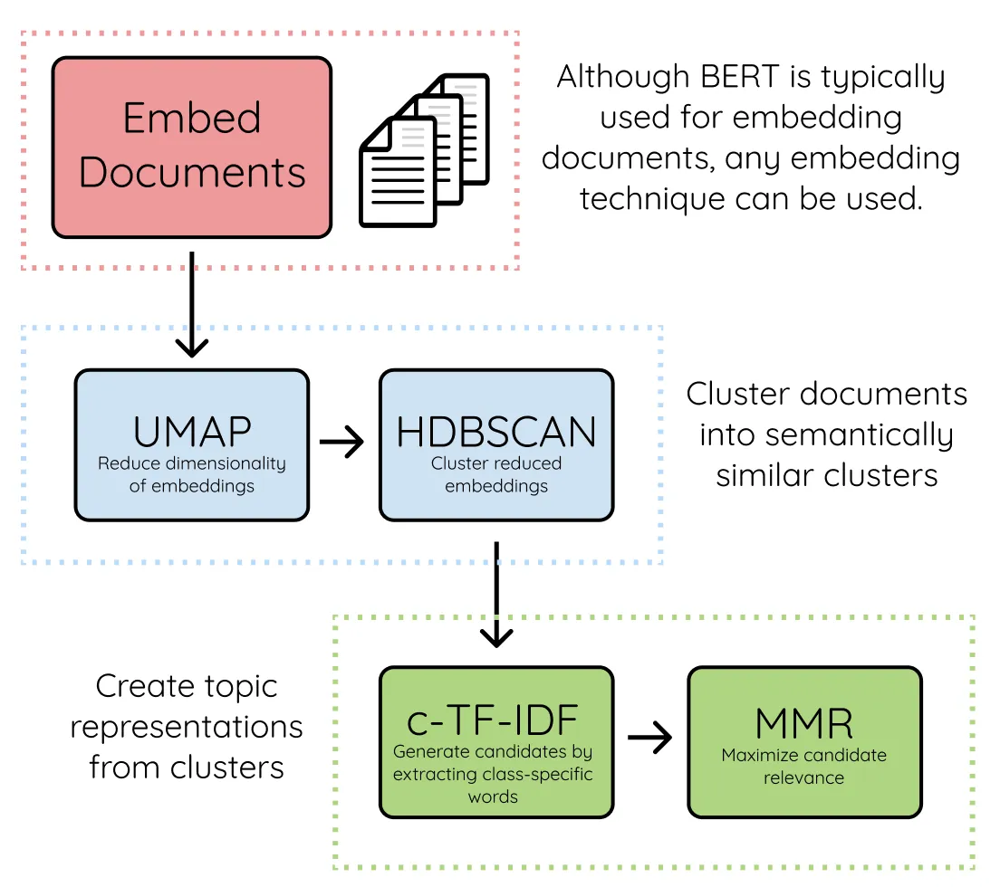

In [15]:
# Initialize BERTopic
topic_model = BERTopic(language="english", calculate_probabilities=False, verbose=True)

# Fit the model
topics, probabilities = topic_model.fit_transform(filtered_events_df['combined_text'].tolist())

# Add the topic information to the dataframe
filtered_events_df['Topic'] = topics

# Reduce dimensionality for visualization
fig_topics = topic_model.visualize_topics()
fig_topics.show()

# Check if probabilities are calculated correctly
if probabilities is not None and len(probabilities) > 0:
    try:
        # Visualize the distribution of topic probabilities
        fig_distribution = topic_model.visualize_distribution(probabilities)
        fig_distribution.show()
    except ValueError as e:
        print(f"Skipping visualize_distribution due to error: {e}")

# Optionally, visualize individual topics using a bar chart
fig_barchart = topic_model.visualize_barchart()
fig_barchart.show()

# Step 1 - Extract embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Step 2 - Reduce dimensionality
umap_model = umap.UMAP(n_neighbors=15, n_components=3, min_dist=0.01, metric='cosine')

# Step 3 - Cluster reduced embeddings
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=20, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

# Step 4 - Tokenize topics
vectorizer_model = CountVectorizer(stop_words="english")

# Step 5 - Create topic representation
ctfidf_model = ClassTfidfTransformer()

# Step 6 - (Optional) Fine-tune topic representations with a `bertopic.representation` model
# Uncomment if you want to use fine-tuning, e.g., with KeyBERTInspired
from bertopic.representation import KeyBERTInspired
representation_model = KeyBERTInspired()

# Initialize BERTopic with the custom models
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model,
    representation_model=representation_model,  # Uncomment if you use fine-tuning
)

# Fit the BERTopic model on the combined text data from filtered_events_df
topics, probabilities = topic_model.fit_transform(filtered_events_df['combined_text'].tolist())

# Add the topic information to the filtered dataframe
filtered_events_df['Topic'] = topics

# Visualize the topic clusters
fig_topics = topic_model.visualize_topics()
fig_topics.show()

# Check if probabilities are calculated correctly
if probabilities is not None and len(probabilities) > 0:
    try:
        # Visualize the distribution of topic probabilities
        fig_distribution = topic_model.visualize_distribution(probabilities)
        fig_distribution.show()
    except ValueError as e:
        print(f"Skipping visualize_distribution due to error: {e}")

# Visualize individual topics using a bar chart
fig_barchart = topic_model.visualize_barchart()
fig_barchart.show()

# For completeness, create a scatter plot of UMAP embeddings with HDBSCAN clusters
fig_umap_hdbscan = px.scatter(filtered_events_df, x='UMAP1', y='UMAP2', color='Cluster', hover_data=['clean_title', 'categories', 'Topic'],
                              title='UMAP of Event Embeddings with HDBSCAN Clustering for Top 5 Categories')

fig_umap_hdbscan.update_layout(
    xaxis_title='UMAP Component 1',
    yaxis_title='UMAP Component 2',
    legend_title='Cluster',
    hovermode='closest'
)

fig_umap_hdbscan.show()

# Summary of clustering results
print("Clustering completed. Number of clusters found:", len(filtered_events_df['Cluster'].unique()))
print("Number of topics identified:", len(filtered_events_df['Topic'].unique()))


2024-07-22 00:30:43,879 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 240/240 [00:28<00:00,  8.53it/s]
2024-07-22 00:31:13,697 - BERTopic - Embedding - Completed ✓
2024-07-22 00:31:13,698 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-07-22 00:31:21,295 - BERTopic - Dimensionality - Completed ✓
2024-07-22 00:31:21,296 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-07-22 00:31:21,456 - BERTopic - Cluster - Completed ✓
2024-07-22 00:31:21,458 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-07-22 00:31:21,950 - BERTopic - Representation - Completed ✓


Clustering completed. Number of clusters found: 166
Number of topics identified: 19


In [16]:
# Initialize the HuggingFace model for creating embeddings
model_name = 'sentence-transformers/all-MiniLM-L6-v2'
embedding_model = SentenceTransformer(model_name)

# Create embeddings for the combined text
embeddings = embedding_model.encode(filtered_events_df['combined_text'].tolist())

# Standardize the embeddings
scaler = StandardScaler()
scaled_embeddings = scaler.fit_transform(embeddings)

# Initialize BERTopic
topic_model = BERTopic(language="english", calculate_probabilities=False, verbose=True)

# Fit the model
topics, probabilities = topic_model.fit_transform(filtered_events_df['combined_text'].tolist())

# Add the topic information to the dataframe
filtered_events_df['Topic'] = topics

# Reduce dimensionality for visualization
fig_topics = topic_model.visualize_topics()
fig_topics.show()

# Check if probabilities are calculated correctly
if probabilities is not None and len(probabilities) > 0:
    try:
        # Visualize the distribution of topic probabilities
        fig_distribution = topic_model.visualize_distribution(probabilities)
        fig_distribution.show()
    except ValueError as e:
        print(f"Skipping visualize_distribution due to error: {e}")

# Optionally, visualize individual topics using a bar chart
fig_barchart = topic_model.visualize_barchart()
fig_barchart.show()

# Custom Initialization for further analysis
umap_model = umap.UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine')
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom', prediction_data=False)
vectorizer_model = CountVectorizer(stop_words="english")
ctfidf_model = ClassTfidfTransformer()
representation_model = KeyBERTInspired()

# Initialize BERTopic with the custom models
topic_model_custom = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    ctfidf_model=ctfidf_model,
    representation_model=representation_model,  # Uncomment if you use fine-tuning
    calculate_probabilities=False,
    verbose=True
)

# Fit the BERTopic model on the combined text data from filtered_events_df
topics_custom, probabilities_custom = topic_model_custom.fit_transform(filtered_events_df['combined_text'].tolist())

# Add the topic information to the filtered dataframe
filtered_events_df['Topic_Custom'] = topics_custom

# Visualize the topic clusters
fig_topics_custom = topic_model_custom.visualize_topics()
fig_topics_custom.show()

# Check if probabilities are calculated correctly
if probabilities_custom is not None and len(probabilities_custom) > 0:
    try:
        # Visualize the distribution of topic probabilities
        fig_distribution_custom = topic_model_custom.visualize_distribution(probabilities_custom)
        fig_distribution_custom.show()
    except ValueError as e:
        print(f"Skipping visualize_distribution due to error: {e}")

# Visualize individual topics using a bar chart
fig_barchart_custom = topic_model_custom.visualize_barchart()
fig_barchart_custom.show()

# For completeness, create a scatter plot of UMAP embeddings with HDBSCAN clusters
umap_embeddings_custom = umap_model.fit_transform(embeddings)
filtered_events_df['UMAP1_Custom'] = umap_embeddings_custom[:, 0]
filtered_events_df['UMAP2_Custom'] = umap_embeddings_custom[:, 1]
filtered_events_df['Cluster_Custom'] = hdbscan_model.fit_predict(umap_embeddings_custom)

fig_umap_hdbscan_custom = px.scatter(filtered_events_df, x='UMAP1_Custom', y='UMAP2_Custom', color='Cluster_Custom', hover_data=['clean_title', 'categories', 'Topic_Custom'],
                              title='UMAP of Event Embeddings with HDBSCAN Clustering for Top 5 Categories')

fig_umap_hdbscan_custom.update_layout(
    xaxis_title='UMAP Component 1',
    yaxis_title='UMAP Component 2',
    legend_title='Cluster',
    hovermode='closest'
)

fig_umap_hdbscan_custom.show()

# Summary of clustering results
print("Clustering completed. Number of clusters found:", len(filtered_events_df['Cluster_Custom'].unique()))
print("Number of topics identified:", len(filtered_events_df['Topic_Custom'].unique()))

2024-07-22 00:32:32,450 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 240/240 [00:30<00:00,  7.93it/s]
2024-07-22 00:33:04,226 - BERTopic - Embedding - Completed ✓
2024-07-22 00:33:04,226 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-07-22 00:33:09,804 - BERTopic - Dimensionality - Completed ✓
2024-07-22 00:33:09,806 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-07-22 00:33:10,061 - BERTopic - Cluster - Completed ✓
2024-07-22 00:33:10,064 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-07-22 00:33:10,652 - BERTopic - Representation - Completed ✓


2024-07-22 00:33:11,463 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 240/240 [00:47<00:00,  5.08it/s]
2024-07-22 00:33:59,044 - BERTopic - Embedding - Completed ✓
2024-07-22 00:33:59,044 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-07-22 00:34:08,272 - BERTopic - Dimensionality - Completed ✓
2024-07-22 00:34:08,275 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-07-22 00:34:08,612 - BERTopic - Cluster - Completed ✓
2024-07-22 00:34:08,617 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-07-22 00:34:14,995 - BERTopic - Representation - Completed ✓


Clustering completed. Number of clusters found: 62
Number of topics identified: 52
